In [ ]:
import os
import geopandas as gpd
import requests
from urllib.parse import urlencode

import geodatasets as gd
import matplotlib.pyplot as plt
from shapely.geometry import Point
from pyproj import Transformer
import contextily as cx

def download_tiles(sel_gdf, url_field, out_dir="tiles"):
    os.makedirs(out_dir, exist_ok=True)
    for idx, row in sel_gdf.iterrows():
        url = row[url_field]
        fname = os.path.join(out_dir, os.path.basename(url))
        if os.path.exists(fname):
            print("Already have", fname)
            continue
        print("Downloading", url)
        r = requests.get(url, stream=True)
        if r.status_code != 200:
            print("Failed:", url, r.status_code)
            continue
        with open(fname, 'wb') as f:
            for chunk in r.iter_content(chunk_size=8192):
                if chunk:
                    f.write(chunk)
            print("Saved to ", fname)
    print("Download complete.")

def filter_tiles(gdf, bbox):
    # bbox dict with lon_min, lat_min, lon_max, lat_max in same CRS
    import shapely.geometry as geom
    box_geom = geom.box(bbox["lon_min"], bbox["lat_min"], bbox["lon_max"], bbox["lat_max"])
    sel = gdf[gdf.intersects(box_geom)]
    return sel


def get_tile_index(layer_name, save_path=None):
    wfs_url = "https://data.geopf.fr/wfs/ows"
    params = {
        "SERVICE": "WFS",
        "VERSION": "2.0.0",
        "REQUEST": "GetFeature",
        "TYPENAMES": layer_name,
        "OUTPUTFORMAT": "application/json"
    }
    resp = requests.get(wfs_url, params=params, stream=True)
    resp.raise_for_status()
    geojson = resp.json()
    gdf = gpd.GeoDataFrame.from_features(geojson["features"], crs="EPSG:2154")  # assume EPSG:2154/Lambert‑93
    if save_path:
        gdf.to_file(save_path, driver="GPKG")
    return gdf



def plot_tile_centroids_with_basemap(gdf, gdf_metropole, name="LIDAR", crs_source="EPSG:2154", crs_target="EPSG:4326"):
    """
    Plot the centroids of all tiles on a map of France with basemap.
    
    Parameters:
        gdf : GeoDataFrame
            GeoDataFrame containing tile polygons in Lambert-93 (EPSG:2154)
        crs_source : str
            CRS of the input gdf (default EPSG:2154)
        crs_target : str
            CRS to transform centroids to (default EPSG:4326 / WGS84)
    """
    # Transformer Lambert-93 -> WGS84
    transformer = Transformer.from_crs(crs_source, crs_target, always_xy=True)
    
    # Compute centroids and transform coordinates
    centroids_lonlat = []
    for geom in gdf.geometry:
        centroid = geom.centroid
        lon, lat = transformer.transform(centroid.x, centroid.y)
        centroids_lonlat.append((lon, lat))
    
    # Create GeoDataFrame of points in WGS84
    points_gdf = gpd.GeoDataFrame(
        geometry=[Point(lon, lat) for lon, lat in centroids_lonlat],
        crs=crs_target
    )
        
    # Plot
    fig, ax = plt.subplots(figsize=(10, 12))
    # gdf_metropole.plot(ax=ax, color="lightgray", edgecolor="black")
    points_gdf.plot(ax=ax, color="red", markersize=5, label="Tile centroids")
    
    # Add basemap using contextily
    cx.add_basemap(ax, crs=points_gdf.crs.to_string(), source=cx.providers.CartoDB.Voyager)
    
    ax.set_title(name)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    plt.legend()
    plt.show()

def download_cop_dem(bbox, api_key, output_file):
    product = "COP30"

    # -----------------------
    # Build request URL
    # -----------------------
    API_URL = (
        "https://portal.opentopography.org/API/globaldem"
        f"?demtype={product}"
        f"&south={bbox['lat_min']}&north={bbox['lat_max']}"
        f"&west={bbox['lon_min']}&east={bbox['lon_max']}"
        "&outputFormat=GTiff"
        f"&API_Key={api_key}"
    )

    print("Request:", API_URL)

    # Download raster directly
    response = requests.get(API_URL, stream=True)

    if response.status_code != 200:
        print("\n❌ HTTP error:", response.status_code)
        print(response.text)
        raise SystemExit

    # Save to file
    with open(output_file, "wb") as f:
        for chunk in response.iter_content(chunk_size=8192):
            if chunk:
                f.write(chunk)

    print("✅ Saved →", output_file)

def download_contextly_image(bbox):
    """
    Downloads a contextual basemap image (e.g., for visualization) for the given bounding box.

    Parameters:
    - bbox (shapely.geometry.Polygon): Bounding box as a shapely box geometry.

    Returns:
    - cx_img (ndarray): Image array of the map tiles covering the bounding box.
    """

    cx_img, ext = cx.bounds2img(bbox["lon_min"],
                             bbox["lat_min"],
                             bbox["lon_max"],
                             bbox["lat_max"],
                             ll=True,
                             source=cx.providers.CartoDB.Voyager)

    return cx_img

### Settings

In [ ]:
##### TO BE FILLED BY USER #####
api_key = "38b3211483d503ddd81882f2259b6201"   # <-- put your api key of opentopography here

base_dir = "/home/renauld/DSM/"
data_dir = os.path.join(base_dir, "data")

area = "Caen"
# Define bbox in WGS84
lon_wgs84, lat_wgs84 = -0.3, 49.2  # Caen
box_size = 0.01 # degrees
#####


lidar_dir= os.path.join(data_dir, "lidar50cm_tiles", area)
cop_dir = os.path.join(data_dir, "cop30m_tiles", area)

os.makedirs(lidar_dir, exist_ok=True)
os.makedirs(cop_dir, exist_ok=True)



transformer_to_l93 = Transformer.from_crs("EPSG:4326", "EPSG:2154", always_xy=True)
transformer_to_wgs84 = Transformer.from_crs("EPSG:2154", "EPSG:4326", always_xy=True)

# layer = "IGNF_LIDAR-HD_TA:mns-dalle"
layer = "IGNF_LIDAR-HD_MNS_GRAPHE-MOSAIQUAGE:mns-dalle"

lon_min_wgs84, lat_min_wgs84 = lon_wgs84 - box_size, lat_wgs84 - box_size
lon_max_wgs84, lat_max_wgs84 = lon_wgs84 + box_size, lat_wgs84 + box_size
bbox_wgs84 = {"lon_min": lon_min_wgs84, "lat_min": lat_min_wgs84, "lon_max": lon_max_wgs84, "lat_max": lat_max_wgs84}

# Convert bbox to Lambert-93
lon_min_l93, lat_min_l93 = transformer_to_l93.transform(lon_min_wgs84, lat_min_wgs84)
lon_max_l93, lat_max_l93 = transformer_to_l93.transform(lon_max_wgs84, lat_max_wgs84)
bbox_l93 = {"lon_min": lon_min_l93, "lat_min": lat_min_l93, "lon_max": lon_max_l93, "lat_max": lat_max_l93}
roi_geom_l93 = box(lon_min_l93, lat_min_l93, lon_max_l93, lat_max_l93)

gdf = get_tile_index(layer, save_path="tile_index_mns.gpkg")
print(len(gdf))

print("BBox in Lambert-93:", bbox_l93)
sel = filter_tiles(gdf, bbox_l93)
print("Selected tiles: ", len(sel))
print(len(sel))
first_sel = sel.iloc[[0]]

download_tiles(sel, url_field="url", out_dir=out_dir)


### Plot the available Lidar database in France

In [ ]:
import requests
from lxml import etree

def list_layers_wfs(url):
    params = {
        "SERVICE": "WFS",
        "REQUEST": "GetCapabilities",
        "VERSION": "2.0.0"
    }
    r = requests.get(url, params=params)
    r.raise_for_status()

    root = etree.fromstring(r.content)
    ns = {"wfs": "http://www.opengis.net/wfs/2.0"}

    layers = root.findall(".//wfs:FeatureType/wfs:Name", namespaces=ns)
    return [l.text for l in layers]

layers = list_layers_wfs("https://data.geopf.fr/wfs/ows")
# for l in layers:
#     print(l)

lidar_layers = [l for l in layers if "LIDAR" in l.upper()]
print("Available LiDAR layers:")
for layer in lidar_layers:
    print(layer)

Available LiDAR layers:
IGNF_LIDAR-HD_TA:nuage-bloc
IGNF_MNH-LIDAR-HD:bloc
IGNF_LIDAR-HD_TA:mnh-bloc
IGNF_LIDAR-HD_MNH_GRAPHE-MOSAIQUAGE:mnh-bloc
IGNF_MNS-LIDAR-HD:bloc
IGNF_LIDAR-HD_TA:mns-bloc
IGNF_LIDAR-HD_MNS_GRAPHE-MOSAIQUAGE:mns-bloc
IGNF_MNT-LIDAR-HD:bloc
IGNF_LIDAR-HD_MNT_GRAPHE-MOSAIQUAGE:mnt-bloc
IGNF_LIDAR-HD_TA:mnt-bloc
IGNF_NUAGES-DE-POINTS-LIDAR-HD:bloc
IGNF_MNH-LIDAR-HD:dalle
IGNF_LIDAR-HD_TA:mnh-dalle
IGNF_LIDAR-HD_MNH_GRAPHE-MOSAIQUAGE:mnh-dalle
IGNF_MNS-LIDAR-HD:dalle
IGNF_LIDAR-HD_TA:mns-dalle
IGNF_LIDAR-HD_MNS_GRAPHE-MOSAIQUAGE:mns-dalle
IGNF_MNT-LIDAR-HD:dalle
IGNF_LIDAR-HD_TA:mnt-dalle
IGNF_LIDAR-HD_MNT_GRAPHE-MOSAIQUAGE:mnt-dalle
IGNF_NUAGES-DE-POINTS-LIDAR-HD:dalle
IGNF_LIDAR-HD_TA:nuage-dalle


Number of tiles: 180


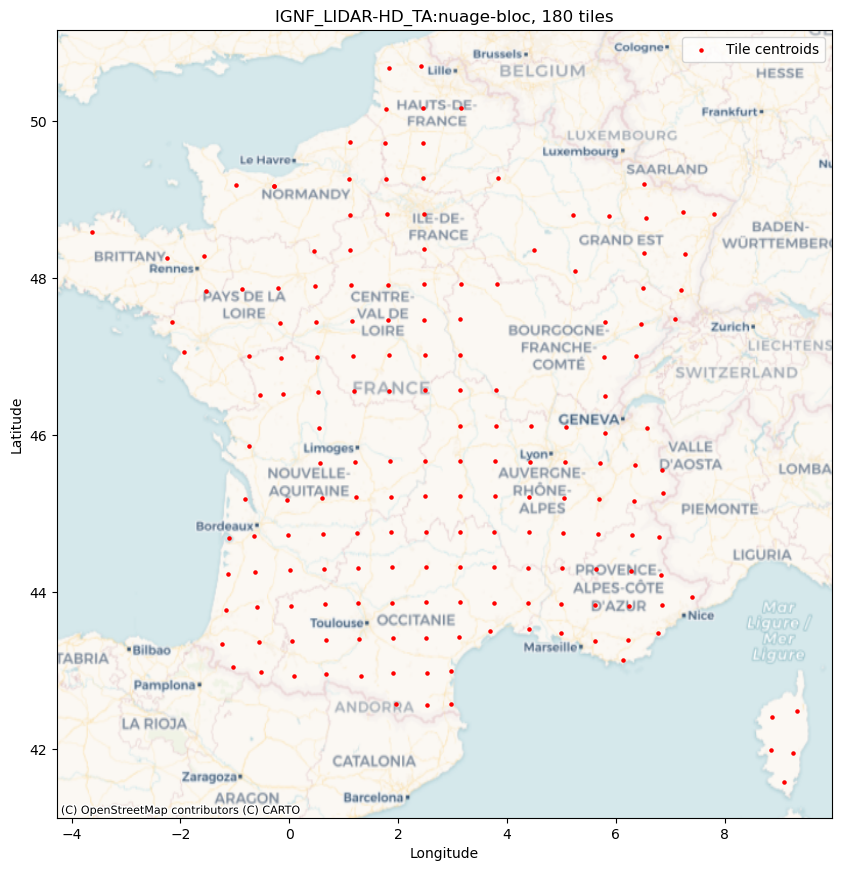

Number of tiles: 198


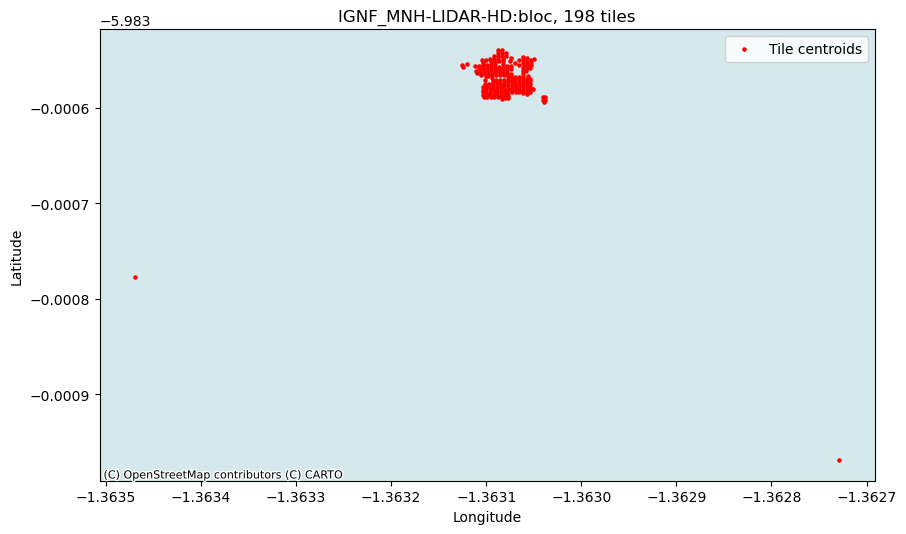

Number of tiles: 197


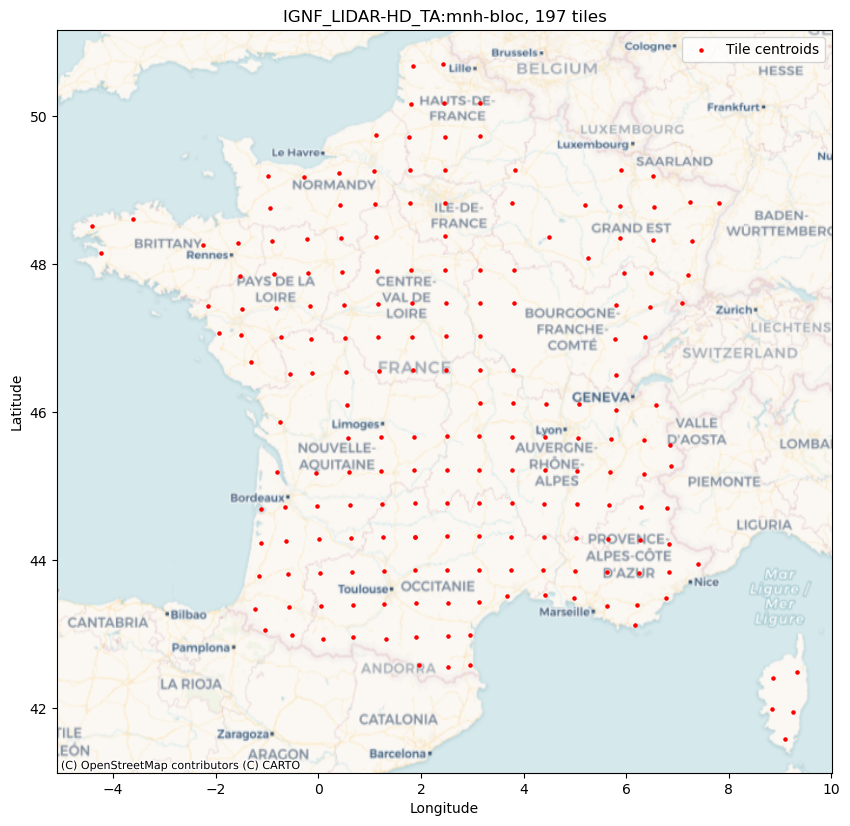

Number of tiles: 197


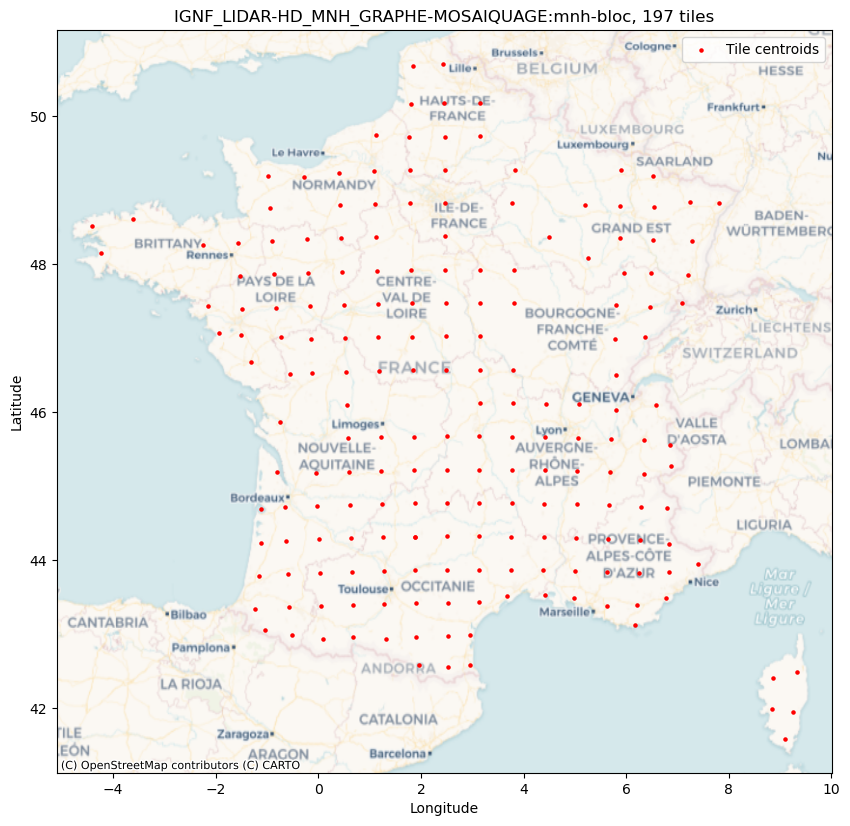

Number of tiles: 198


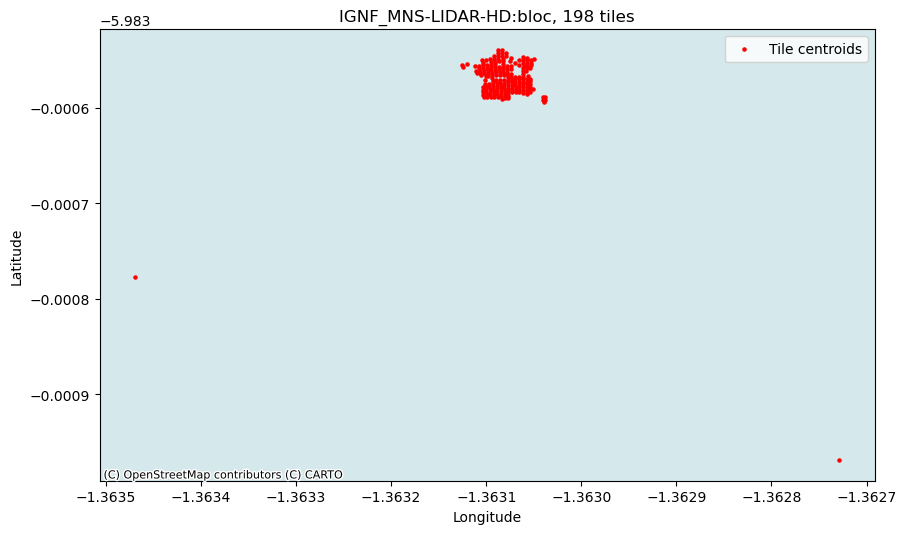

Number of tiles: 197


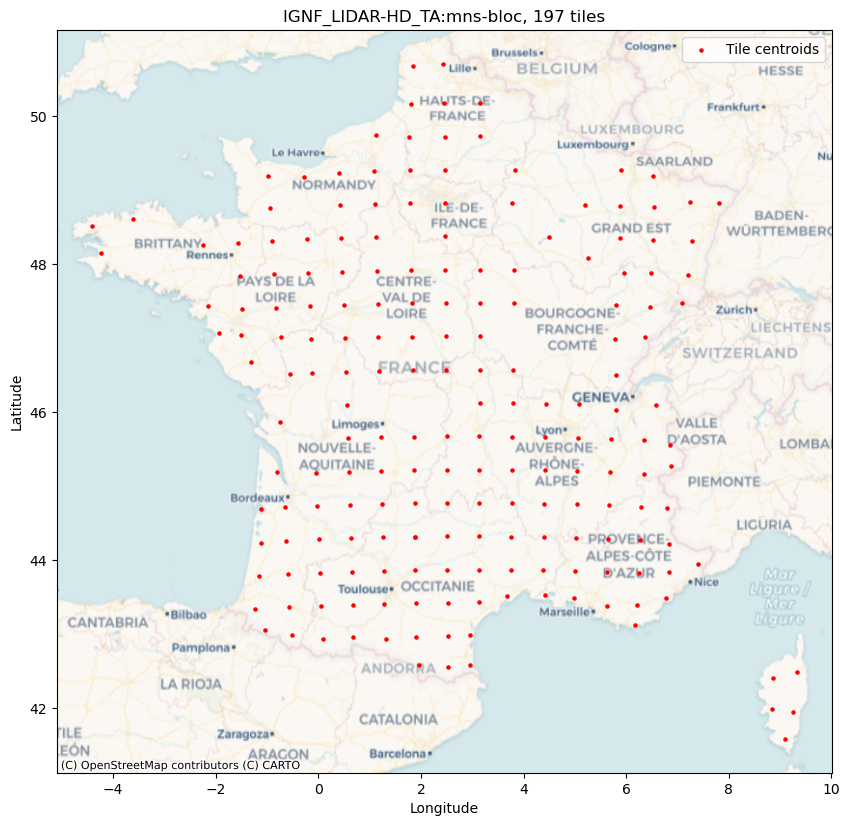

Number of tiles: 197


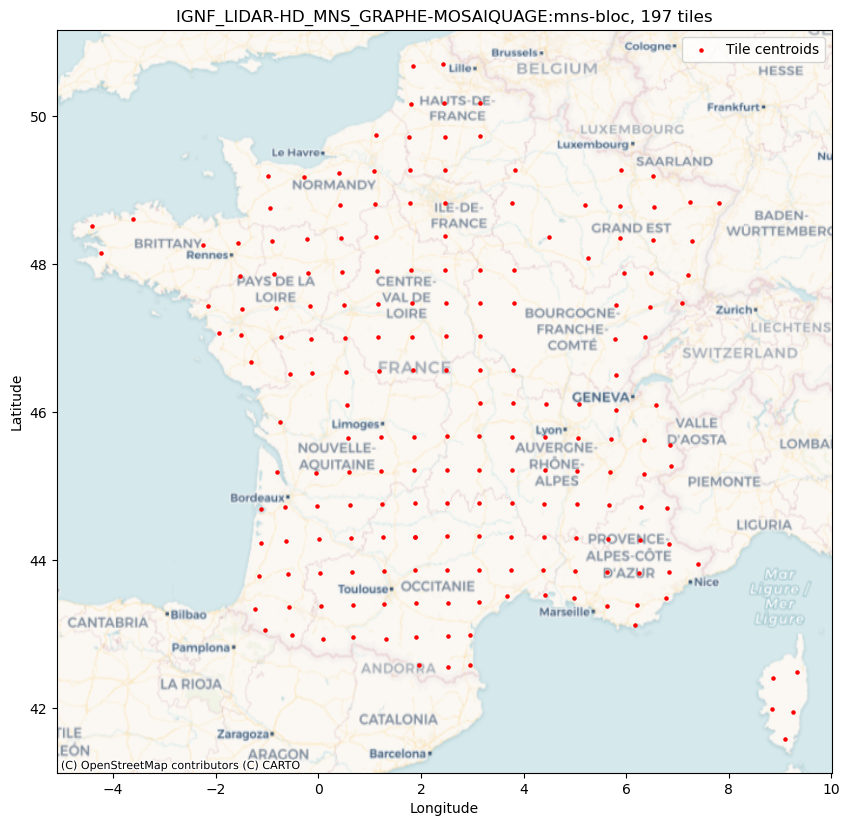

Number of tiles: 198


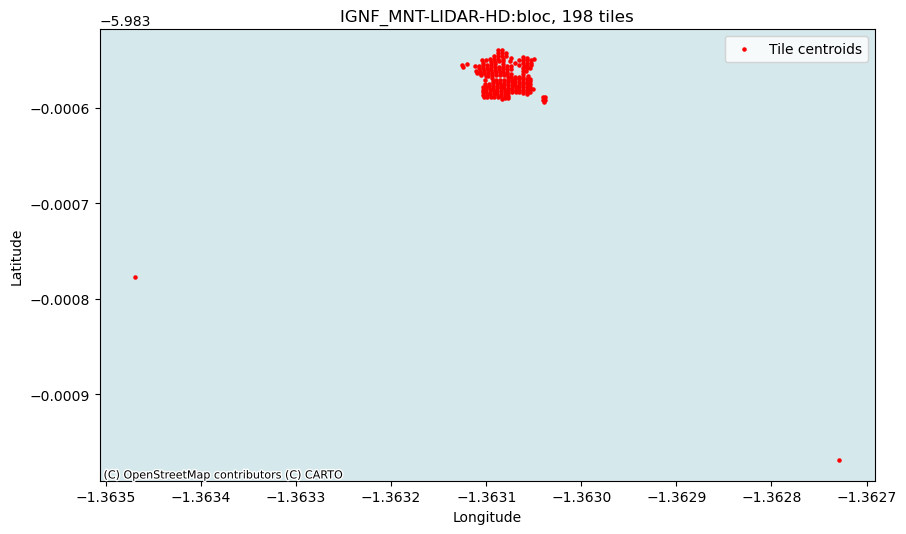

Number of tiles: 197


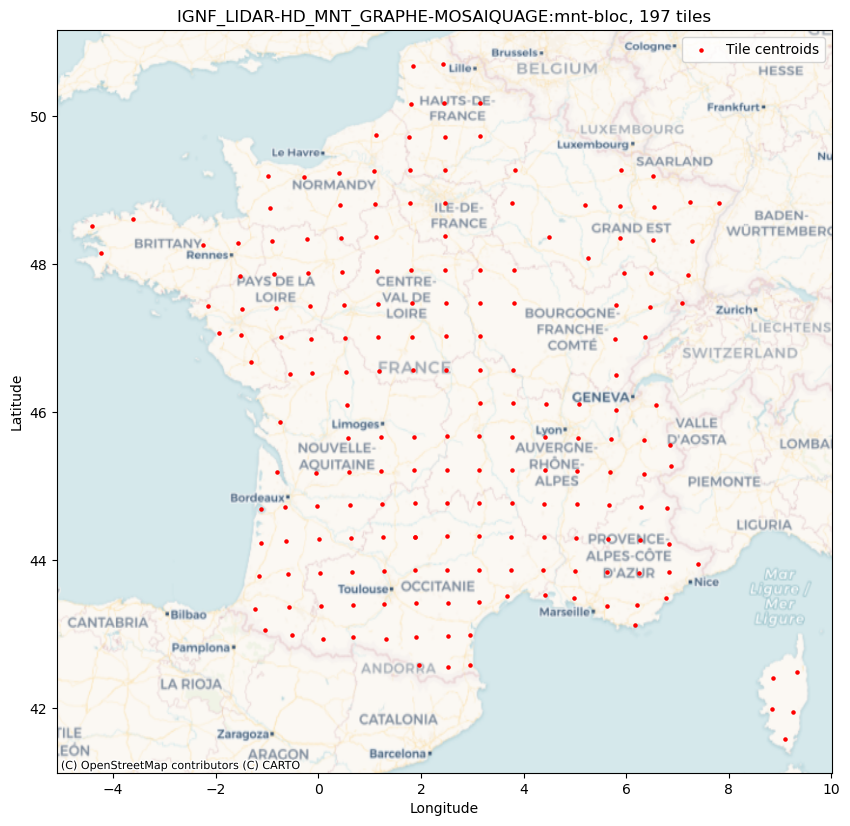

Number of tiles: 197


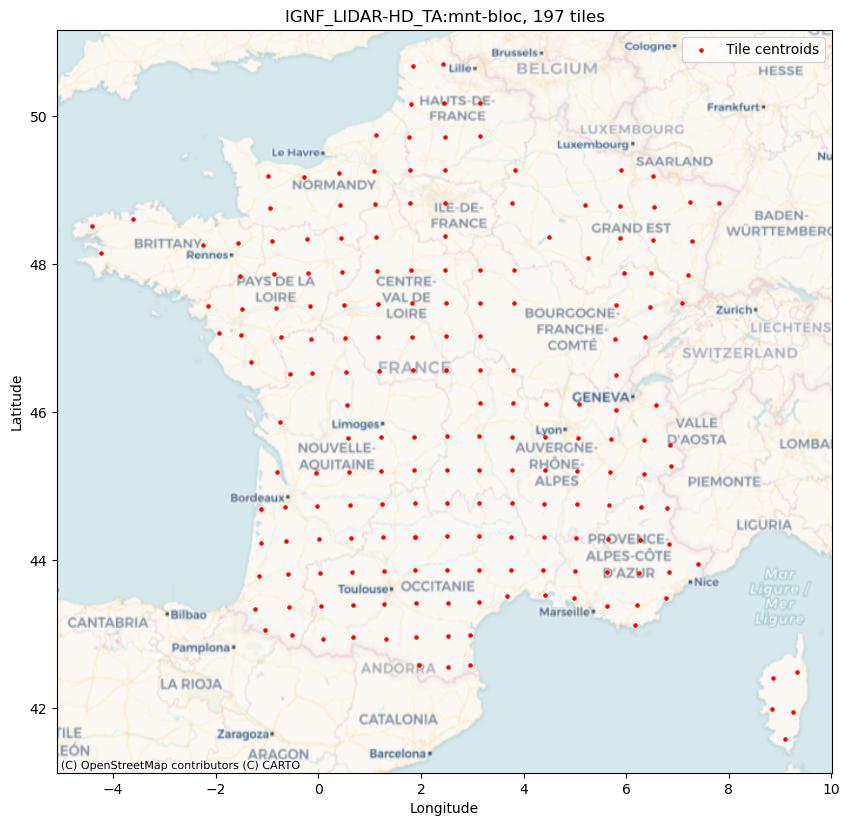

Number of tiles: 198


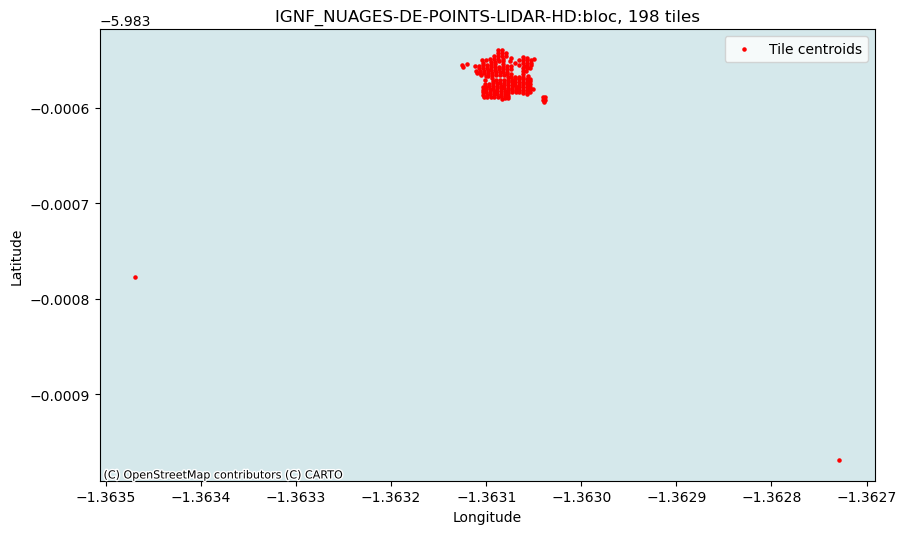

Number of tiles: 5000


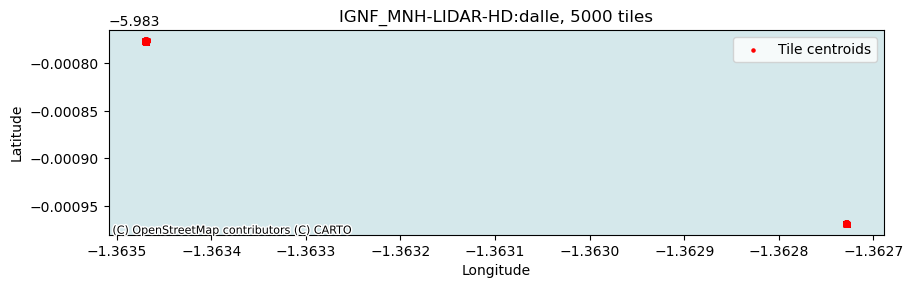

Number of tiles: 5000


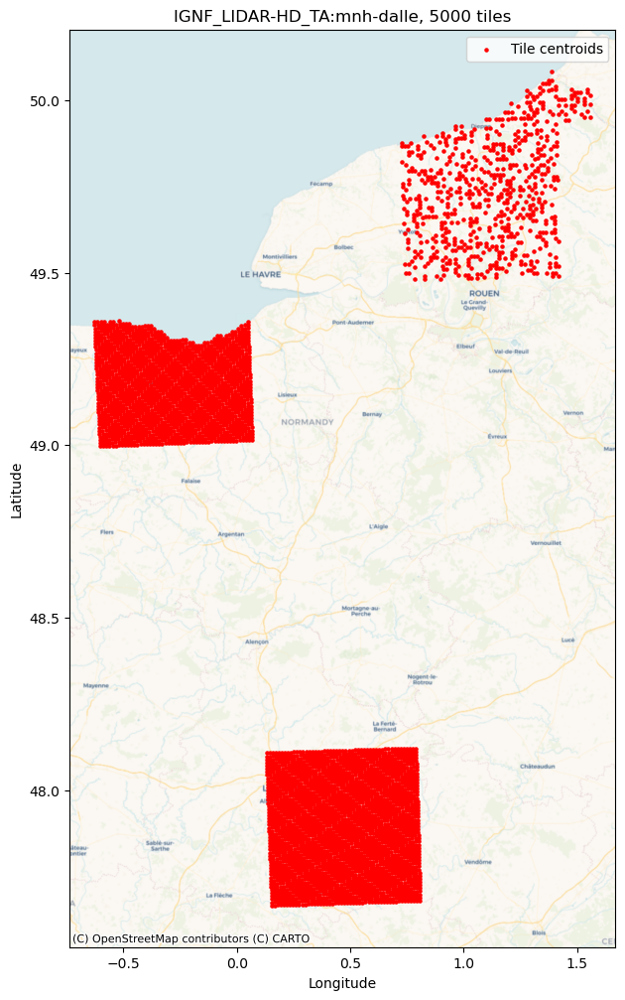

Number of tiles: 5000


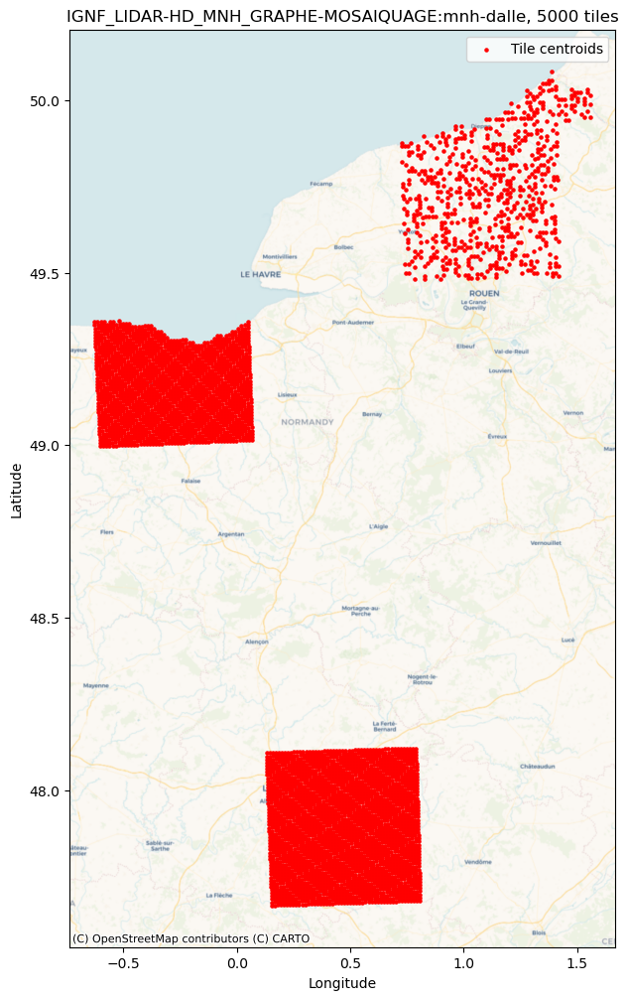

Number of tiles: 5000


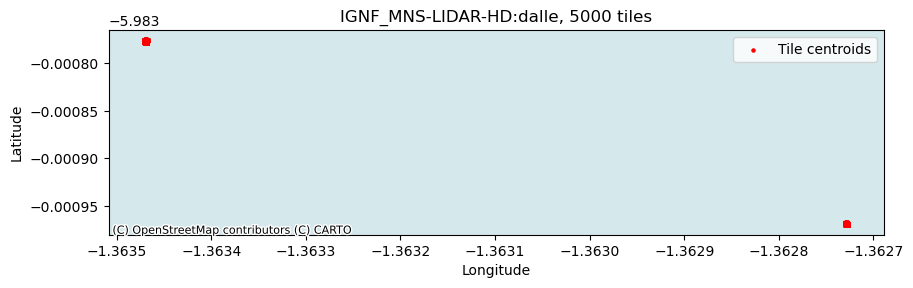

Number of tiles: 5000


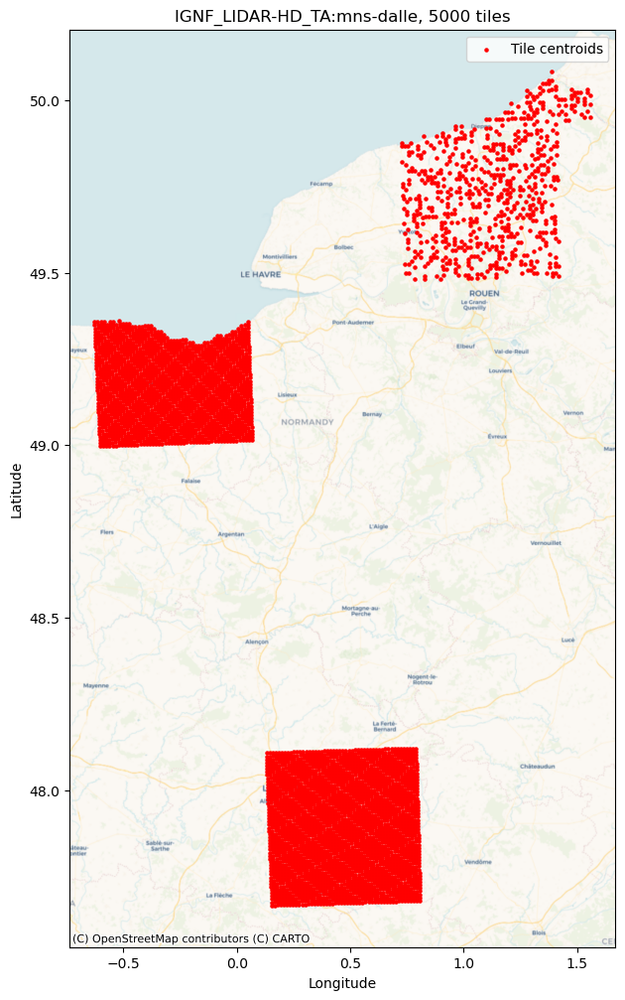

Number of tiles: 5000


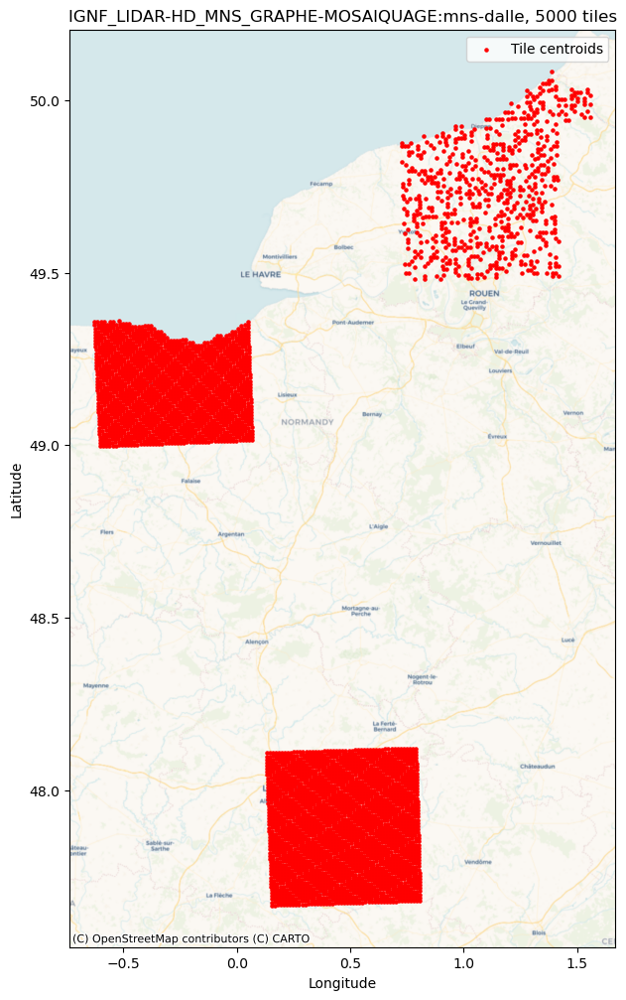

Number of tiles: 5000


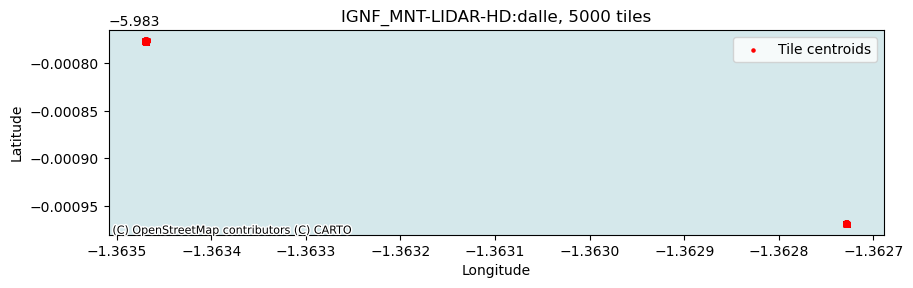

Number of tiles: 5000


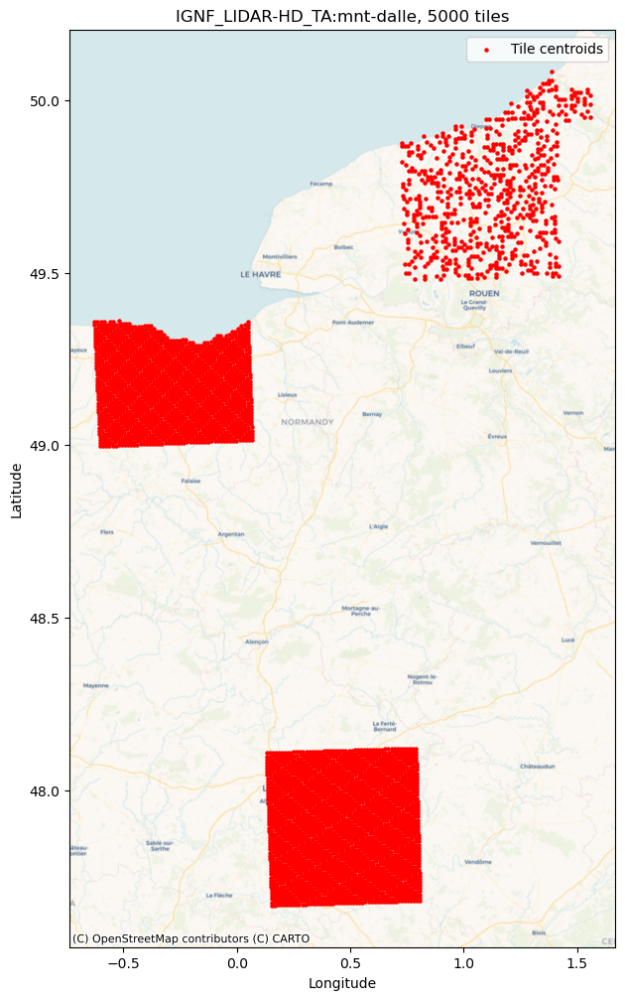

Number of tiles: 5000


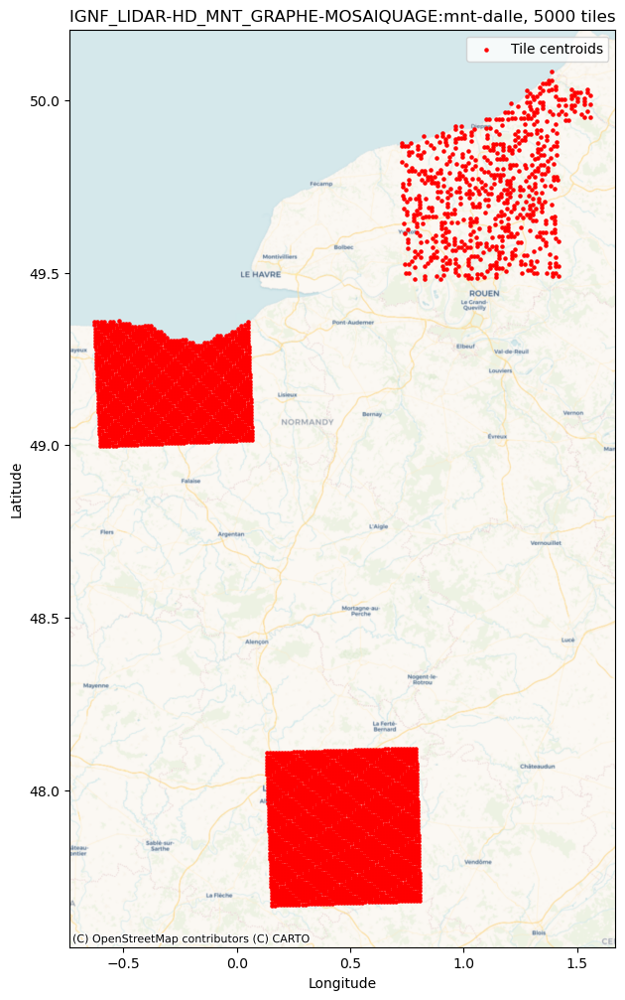

Number of tiles: 5000


/opt/conda/envs/ri-ml-base/lib/python3.12/site-packages/contextily/tile.py:645: UserWarning: The inferred zoom level of 25 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


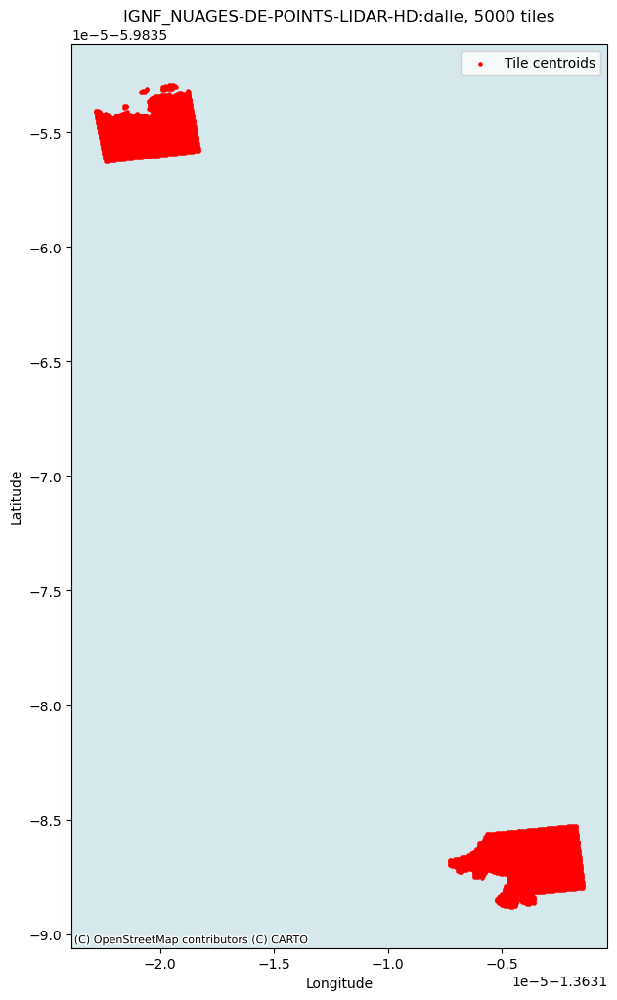

Number of tiles: 5000


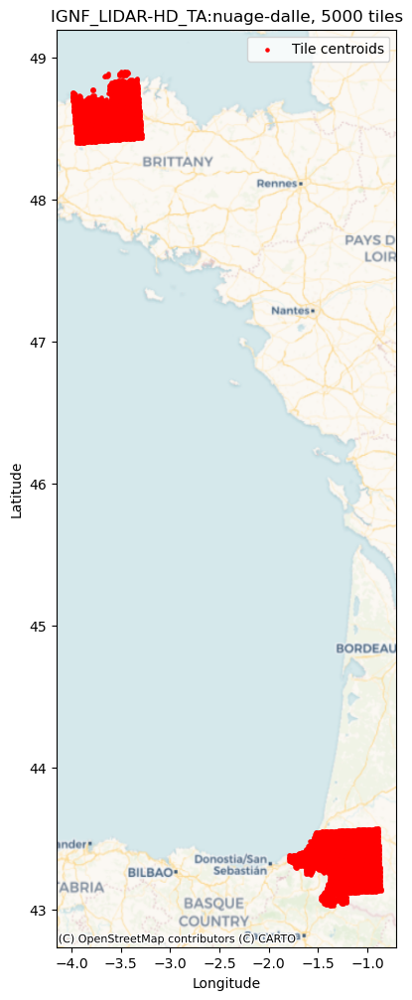

In [ ]:
shapefile_world_path = os.path.join(data_dir, "ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp")

# Load the world shapefile
world = gpd.read_file(shapefile_world_path)

# Load the "ne_110m_admin_0_countries" dataset
france = world[world.NAME == "France"]
# france.plot(figsize=(8, 10), color="lightgray", edgecolor="black")

# Keep only the largest polygon (metropolitan France)
france_metropole = france.geometry.iloc[0]  # if it's multipolygon
if france_metropole.geom_type == "MultiPolygon":
    # Take the polygon with largest area
    france_metropole = max(france_metropole.geoms, key=lambda p: p.area)

# Plot
gdf_metropole = gpd.GeoDataFrame(geometry=[france_metropole], crs=france.crs)


for layer in lidar_layers:
    # layer = "IGNF_LIDAR-HD_TA:mns-dalle"
    # layer = "IGNF_LIDAR-HD_MNS_GRAPHE-MOSAIQUAGE:mns-bloc"
    gdf = get_tile_index(layer, save_path="tile_index_mns.gpkg")

    print("Number of tiles:", len(gdf))
    name = f"{layer}, {len(gdf)} tiles"
    plot_tile_centroids_with_basemap(gdf, gdf_metropole, name)

### The correct database with associated download links are the mns:dalle

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=457999.75,6905000.25,458999.75,6906000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0458_6906_MNS_O_0M50_LAMB93_IGN69.tif


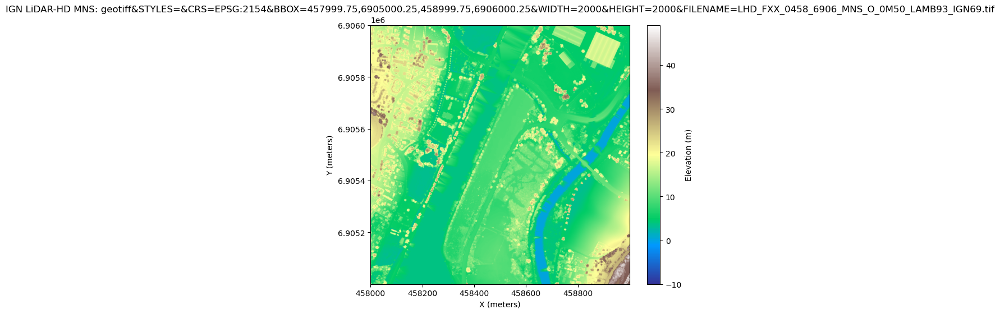

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=459999.75,6906000.25,460999.75,6907000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0460_6907_MNS_O_0M50_LAMB93_IGN69.tif


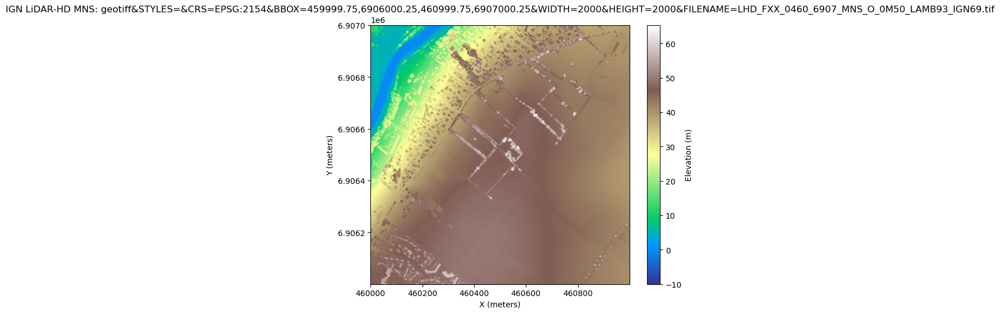

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=458999.75,6903000.25,459999.75,6904000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0459_6904_MNS_O_0M50_LAMB93_IGN69.tif


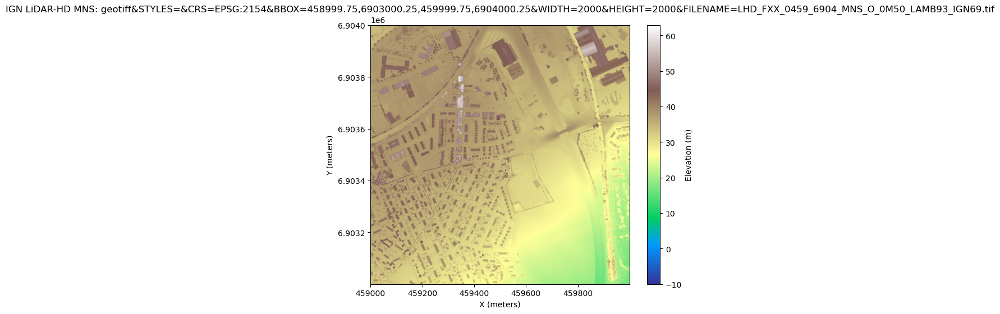

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=457999.75,6904000.25,458999.75,6905000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0458_6905_MNS_O_0M50_LAMB93_IGN69.tif


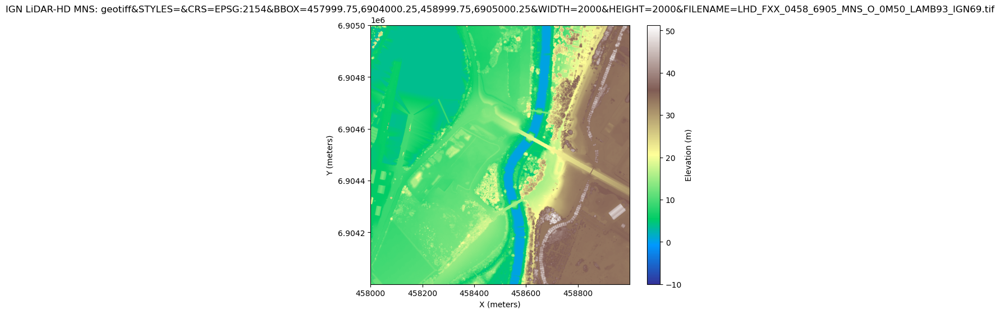

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=459999.75,6903000.25,460999.75,6904000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0460_6904_MNS_O_0M50_LAMB93_IGN69.tif


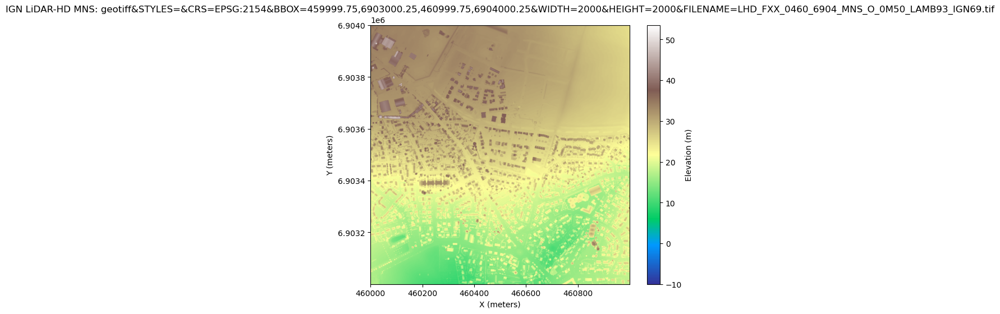

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=459999.75,6904000.25,460999.75,6905000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0460_6905_MNS_O_0M50_LAMB93_IGN69.tif


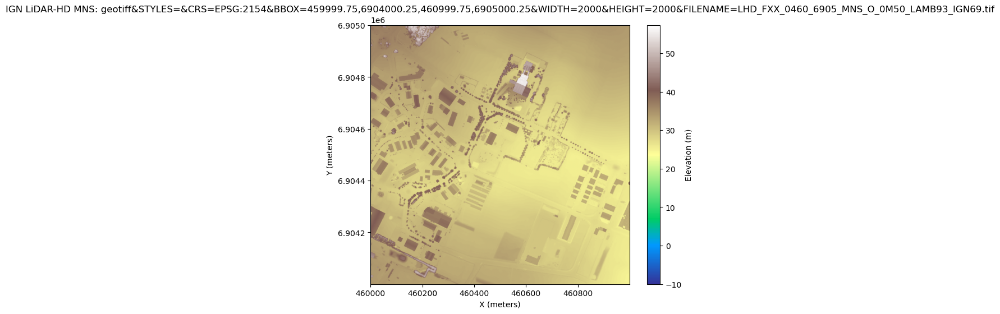

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=459999.75,6905000.25,460999.75,6906000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0460_6906_MNS_O_0M50_LAMB93_IGN69.tif


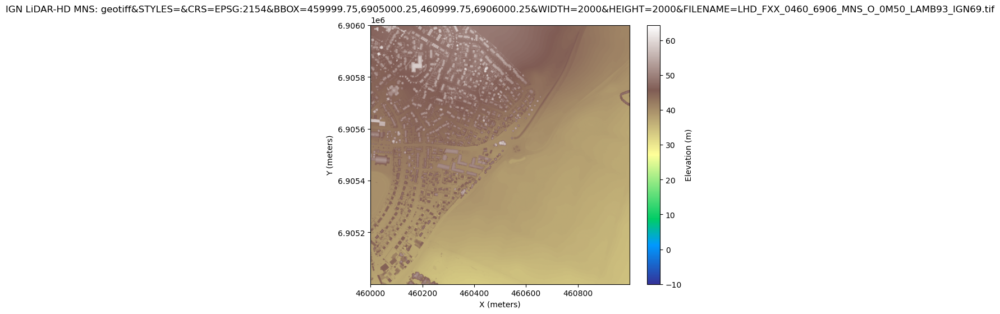

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=458999.75,6906000.25,459999.75,6907000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0459_6907_MNS_O_0M50_LAMB93_IGN69.tif


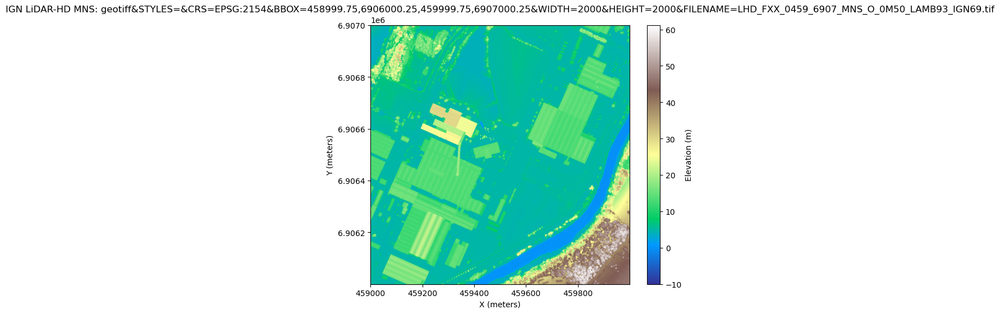

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=458999.75,6905000.25,459999.75,6906000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0459_6906_MNS_O_0M50_LAMB93_IGN69.tif


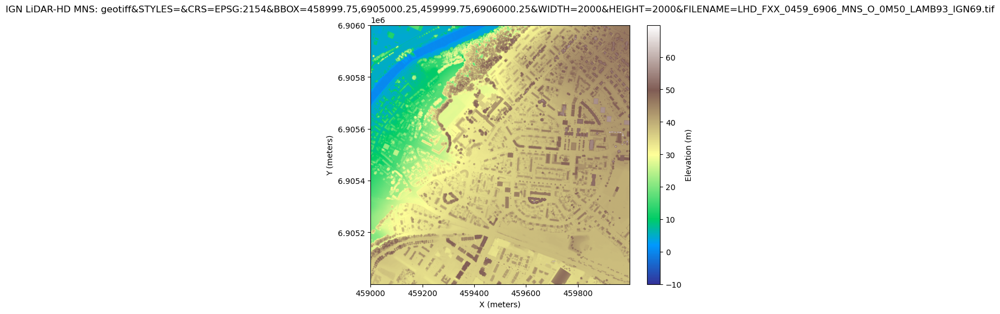

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=457999.75,6906000.25,458999.75,6907000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0458_6907_MNS_O_0M50_LAMB93_IGN69.tif


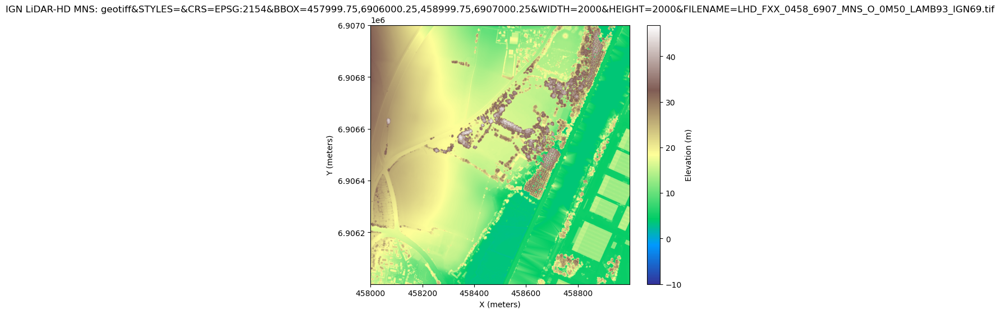

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=458999.75,6904000.25,459999.75,6905000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0459_6905_MNS_O_0M50_LAMB93_IGN69.tif


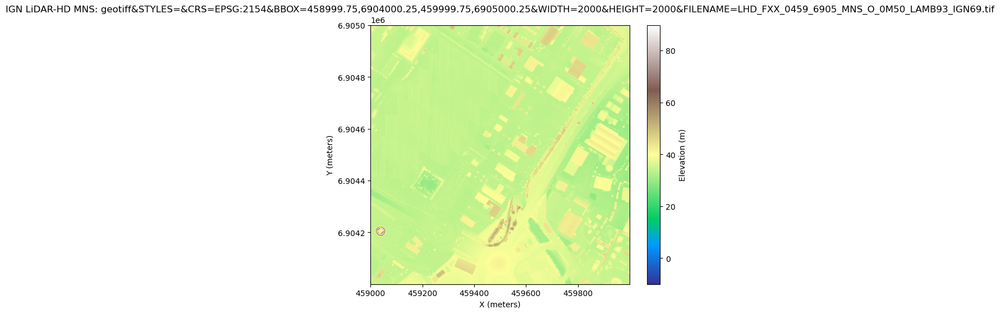

Opening: /home/renauld/DSM/data/mns_tiles/geotiff&STYLES=&CRS=EPSG:2154&BBOX=457999.75,6903000.25,458999.75,6904000.25&WIDTH=2000&HEIGHT=2000&FILENAME=LHD_FXX_0458_6904_MNS_O_0M50_LAMB93_IGN69.tif


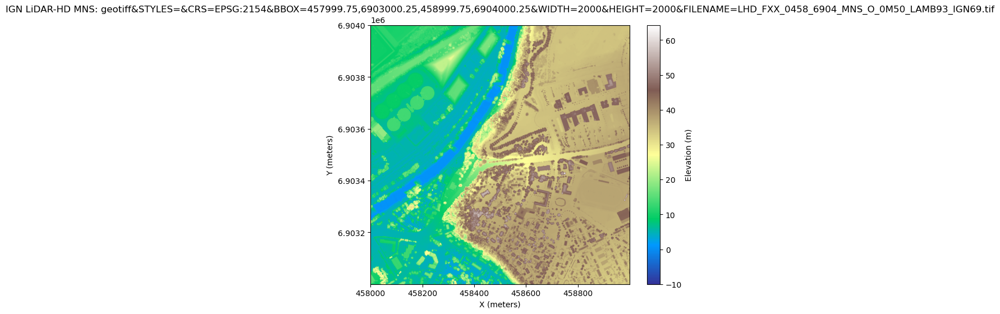

In [100]:
import matplotlib.pyplot as plt
import rasterio
import os

vmin = -10

for root, dirs, files in os.walk(out_dir):
    for f in files:
        if f.endswith(".tif"):
            file_path = os.path.join(root, f)
            print("Opening:", file_path)

            with rasterio.open(file_path) as src:
                dem = src.read(1)
                transform = src.transform  # affine transform

                # Get bounds (xmin, ymin, xmax, ymax)
                bounds = src.bounds
                extent = (bounds.left, bounds.right, bounds.bottom, bounds.top)

                plt.figure(figsize=(8,6))
                plt.imshow(
                    dem,
                    cmap="terrain",
                    extent=extent,      # <-- HERE
                    origin="upper", 
                    vmin = vmin
                )
                plt.colorbar(label="Elevation (m)")
                plt.title(f"IGN LiDAR-HD MNS: {f}")
                plt.xlabel("X (meters)")
                plt.ylabel("Y (meters)")
                plt.show()


In [96]:
from rasterio.merge import merge
from rasterio.mask import mask
from rasterio.io import MemoryFile
import rasterio
import os

def clip_and_merge_tiles(tile_paths, roi_geom, output_path):

    # Open datasets
    srcs = [rasterio.open(p) for p in tile_paths]

    # 1) Merge
    mosaic, mosaic_transform = merge(srcs)

    # Copy metadata
    meta = srcs[0].meta.copy()
    meta.update({
        "height": mosaic.shape[1],
        "width":  mosaic.shape[2],
        "transform": mosaic_transform
    })

    # Properly close
    for s in srcs:
        s.close()

    # 2) Clip
    with MemoryFile() as memfile:
        with memfile.open(**meta) as tmp:
            tmp.write(mosaic)

            clipped, clipped_transform = mask(
                tmp,
                [roi_geom],
                crop=True
            )

    # 3) Save output
    meta.update({
        "height": clipped.shape[1],
        "width":  clipped.shape[2],
        "transform": clipped_transform
    })

    os.makedirs(os.path.dirname(output_path), exist_ok=True)

    with rasterio.open(output_path, "w", **meta) as dst:
        dst.write(clipped)

    return clipped, clipped_transform


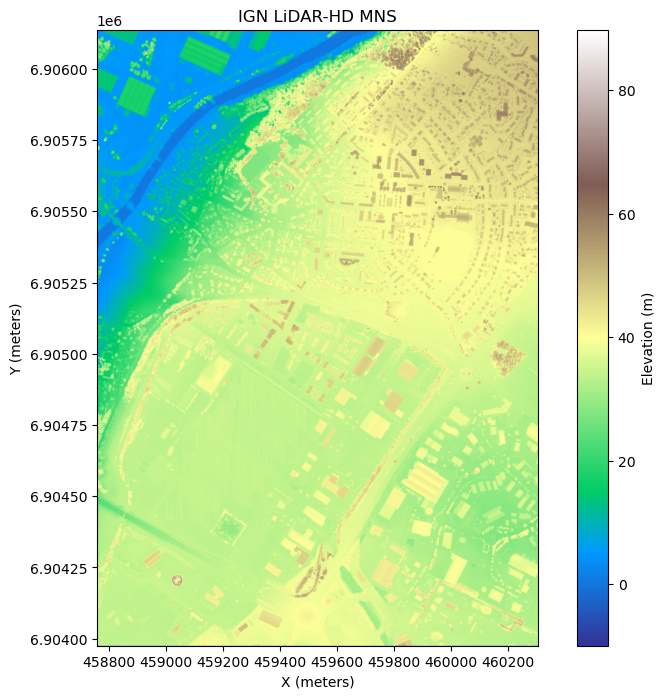

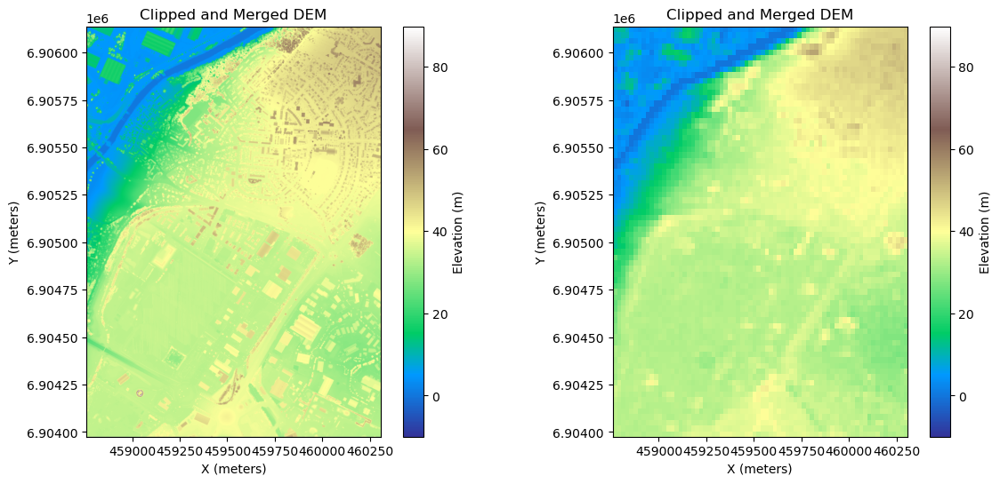

In [113]:
from shapely.geometry import box

output_path = os.path.join(data_dir, "output", "clipped_merged_mns.tif")
tile_paths = [os.path.join(out_dir, f) for f in os.listdir(out_dir) if f.endswith(".tif")]

clipped, clipped_transform = clip_and_merge_tiles(tile_paths, roi_geom_l93, output_path)

with rasterio.open(output_path) as src:
    dem = src.read(1)
    transform = src.transform  # affine transform

    # Get bounds (xmin, ymin, xmax, ymax)
    bounds = src.bounds
    extent = (bounds.left, bounds.right, bounds.bottom, bounds.top)

    plt.figure(figsize=(10,8))
    plt.imshow(
        dem,
        cmap="terrain",
        extent=extent,      # <-- HERE
        origin="upper", 
        vmin = vmin
    )
    plt.colorbar(label="Elevation (m)")
    plt.title(f"IGN LiDAR-HD MNS")
    plt.xlabel("X (meters)")
    plt.ylabel("Y (meters)")
    plt.show()

output_cop = os.path.join(data_dir, "copdem_gl30_test.tif")

with rasterio.open(output_cop) as src:
    cop = src.read(1)
    profile = src.profile
    
fig, ax = plt.subplots(1, 2, figsize=(14, 6))   # 1 row, 2 columns

im0 = ax[0].imshow(
        dem,
        cmap="terrain",
        extent=extent,      # <-- HERE
        origin="upper", 
        vmin = vmin, 
        vmax=dem.max()
    )

ax[0].set_title("Clipped and Merged DEM")
ax[0].set_xlabel("X (meters)")
ax[0].set_ylabel("Y (meters)")
fig.colorbar(im0, ax=ax[0], label="Elevation (m)")

im1 = ax[1].imshow(
        cop,
        cmap="terrain",
        extent=extent,      # <-- HERE
        origin="upper", 
        vmin = vmin, 
        vmax=dem.max()
    )

ax[1].set_title("Clipped and Merged DEM")
ax[1].set_xlabel("X (meters)")
ax[1].set_ylabel("Y (meters)")
fig.colorbar(im1, ax=ax[1], label="Elevation (m)")





In [ ]:
import os, sys
import requests
import contextily as cx
import rasterio
import matplotlib.pyplot as plt
from pyproj import Transformer

# -----------------------
# User parameters
# -----------------------



Request: https://portal.opentopography.org/API/globaldem?demtype=COP30&south=49.190000000000005&north=49.21&west=-0.31&east=-0.29&outputFormat=GTiff&API_Key=38b3211483d503ddd81882f2259b6201
✅ Saved → /home/renauld/DSM/data/copdem_gl30_test.tif
Checking file size...
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 72, 'height': 72, 'count': 1, 'crs': CRS.from_wkt('GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'), 'transform': Affine(0.0002777777777777778, 0.0, -0.31013889999999833,
       0.0, -0.0002777777777777778, 49.2101389), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'lzw', 'interleave': 'band'}


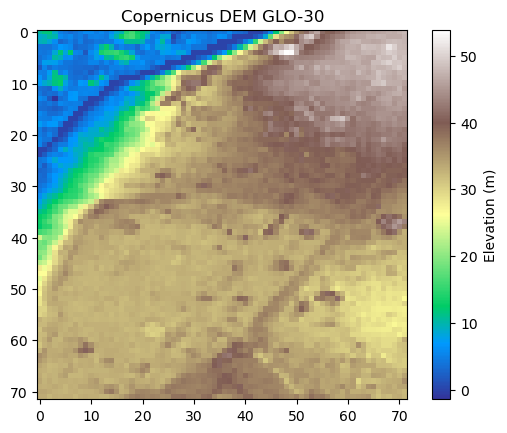

In [110]:

download_cop_dem(bbox_wgs84, api_key, output_file)

print("Checking file size...")

with rasterio.open(output_file) as src:
    dem = src.read(1)
    profile = src.profile
    print(profile)

plt.imshow(dem, cmap="terrain")
plt.colorbar(label="Elevation (m)")
plt.title("Copernicus DEM GLO-30")
plt.show()

    